**Hello! Welcome to the Spotify Playlist Analyzer, conceived and developed by Thomas Holtz.**

# **Getting Started**

First, we need to install the [Spotipy](https://spotipy.readthedocs.io/) and [varname](https://github.com/pwwang/python-varname) packages.

In [1]:
!pip install spotipy
!pip install varname

ERROR! Session/line number was not unique in database. History logging moved to new session 303


Next, we need to initialize authentication (cf. [Spotipy's docs](https://spotipy.readthedocs.io/en/2.22.1/#getting-started)). This includes input for the Client ID and the Client Secret (credentials generated by the Spotify API, which are obtained from the "Settings" module of a project on [the Spotify for Developers dashboard](https://developer.spotify.com/dashboard/)). We'll also take the opportunity to import the [pandas](https://pandas.pydata.org/) and [time](https://docs.python.org/3/library/time.html) packages.

For the Client ID and Client Secret, it is best to set them as environmental variables. A helpful tutorial can be found [here](https://blog.enterprisedna.co/python-set-environment-variable/), while a video tutorial for MacOS can be found [here](https://www.youtube.com/watch?v=kaBVN8uP358). If you want to set them locally or temporarily within an IPython environment like Jupyter, you can input the following (cf. [IPython docs](https://ipython.readthedocs.io/en/stable/interactive/magics.html#magic-env)):

```
%env SPOTIPY_CLIENT_ID=insert_id_here
%env SPOTIPY_CLIENT_SECRET=insert_secret_here
```

If you choose to use Spotipy's Authorization Code Flow, [you will need to set a redirect URI](https://spotipy.readthedocs.io/en/2.22.1/#redirect-uri). In a browserless environment, this is to be copied and entered for verification before the first Spotipy function can be executed (cf. [Stack Overflow](https://stackoverflow.com/a/68651136)).

In [2]:
import spotipy
import pandas as pd
from time import sleep, asctime, gmtime
from collections import defaultdict
from operator import itemgetter
from spotipy.oauth2 import SpotifyClientCredentials
#from spotipy.oauth2 import SpotifyOAuth

sp = spotipy.Spotify(auth_manager=SpotifyClientCredentials())
#sp = spotipy.Spotify(auth_manager=SpotifyOAuth(redirect_uri="https://localhost:8888/callback",
#                                               scope="user-library-read", open_browser=False))

The following is a series of functions used throughout the analyzer:

* **get_playlist_ids()** accepts a Spotify playlist ID as its input. It is designed as a workaround to the 100-song ceiling on Spotify API playlist inquiries, queuing whatever exceeds the ceiling and then extending the queues into a master list of track data. First, it runs [Spotipy's playlist_tracks() function](https://spotipy.readthedocs.io/en/2.22.1/#spotipy.client.Spotify.playlist_tracks), which retrieves track information. The function then prepares and returns sublists of track IDs, artist names, song names and track popularity.
* **playlist_song_data_extractor()** accepts a Spotify playlist ID as its input. It then runs an instance of get_playlist_ids(). If the length of the playlist is less than 100 (the Spotify API's ceiling), it will run a single instance of [Spotipy's audio_features() function](https://spotipy.readthedocs.io/en/2.22.1/#spotipy.client.Spotify.audio_features) (cf. [Spotify API](https://developer.spotify.com/documentation/web-api/reference/get-audio-analysis)). If the length of the playlist exceeds 100, it will subdivide the ID list into lists of 100 (or less if the remainder) and run multiple, separate instances of audio_features() that are ultimately appended to a master list. In order to avoid exceeding Spotify API rate limits, a 0.5-second instance of time.sleep() is executed for each audio_features() instance. Finally, the master list is converted to a pandas dataframe, inserting columns for song names, artist names and track popularity before returning the dataframe.
* **description_generator()** accepts a playlist_song_data_extractor() dataframe as input. It preloads pandas description dataframes and returns them as variables.
* **complete_generator()** wraps playlist_song_data_extractor() and description_generator(), returning a dictionary containing the song dataframe and the description dataframes. It accepts a Spotify playlist ID as input.
* **ms_to_full()** converts a numeric input of miliseconds to a string formatted 'minutes:seconds:miliseconds'.
* **description_matches()** creates a dictionary of songs with parameters matching the description data.
* **number_to_music_key()** takes a numeric input and, if the input is an integer in the range of 0 to 12, returns the corresponding enharmonic key signature. If the input is a float between 0 and 11, it is rounded to the nearest whole integer. Otherwise, the number is passed through unchanged.
* **major_or_minor()** takes 0 or 1 as input and returns the corresponding modality, respectively minor or major. If the input is a float between 0 and 1, the input is rounded to the nearest whole integer. Otherwise, the ouput defaults to major.
* **song_data_formatter()** applies pandas Style formatting to an individual song dataframe.
* **song_data_csv_export()** runs an instance of playlist_song_data_extractor() given a playlist ID, saves an automatically titled .csv file of the outputted dataframe to local storage, and then returns the dataframe. If the "datestamp" parameter is set as True, it will datestamp the .csv file at the moment before generation. This is useful for tracking data from playlists that are regularly updated.
* **complete_generator_with_csv()** is the same as complete_generator(), except it uses song_data_csv_export() instead of playlist_song_data_extractor().
* **song_data_csv_export_post_hoc()** gives you the option of saving a song dataframe as a .csv file even after it has been passed through complete_generator() (i.e. *post hoc*). Using a song data dictionary as input, it will save the 'song_data' dataframe as an automatically titled .csv. As with song_data_csv_export(), if the "datestamp" parameter is set as True, it will datestamp the .csv file with the time at which the function was run.

In [3]:
def get_playlist_ids(playlist_id): # cf. https://github.com/spotipy-dev/spotipy/issues/246
    r = sp.playlist_tracks(playlist_id)
    t = r['items']
    ids = []
    song_names = []
    artists = []
    popularity = []
    while r['next']:
        r = sp.next(r)
        t.extend(r['items'])
    for s in t:
      ids.append(s["track"]["id"])
      song_names.append(s["track"]['name'])
      artists.append([j['name'] for j in s["track"]['artists']]) \
        if len(s["track"]['artists']) > 1 else artists.append(s["track"]['artists'][0]['name'])
      popularity.append(s["track"]['popularity'])
    return ids, song_names, artists, popularity

def playlist_song_data_extractor(playlist_id):
  ids, song_names, song_artists, song_popularity = get_playlist_ids(playlist_id)
  if len(ids) <= 100:
    audio_features = sp.audio_features(tracks=ids)
  else:
    ids = [ids[i:i+100] for i in range(0,len(ids),100)] # cf. https://www.reddit.com/r/learnpython/comments/mdtzqu/comment/gsbcn92/
    audio_features = []
    for i in ids:
      sleep(0.5) # Helps to circumvent hitting the Spotify API's rate limit
      audio_features.append(sp.audio_features(tracks=i))
    audio_features = sum(audio_features, [])
  songs_data = pd.DataFrame.from_dict({n+1: i for n,i in enumerate(audio_features)}, orient='index')
  songs_data.insert(0, "Song Name", song_names, True)
  songs_data.insert(1, "Artist Name", song_artists, True)
  songs_data.insert(2, "popularity", song_popularity, True)
  return songs_data

def description_generator(song_data_frame):
  description = song_data_frame.describe().drop('count')
  song_data_frame_unnested_names = song_data_frame.explode('Artist Name')
  full_description = song_data_frame.describe(include='all')
  full_description['Artist Name'] = song_data_frame_unnested_names.describe(include='all')['Artist Name']
  artist_frequency = song_data_frame_unnested_names['Artist Name'].value_counts()
  return description, full_description, artist_frequency

def complete_generator(id):
  song_data = playlist_song_data_extractor(id)
  description, full_description, artist_frequency = description_generator(song_data)
  return {'song_data': song_data, 'description': description, 'full_description': full_description, 'artist_frequency': artist_frequency}

def ms_to_full(ms):
    sec = ms // 1000
    minute = sec // 60
    rem_sec = sec % 60
    rem_ms = (ms % 60000) - rem_sec*1000
    return f'{str(int(minute)).zfill(2)}:{str(int(rem_sec)).zfill(2)}:{str(int(rem_ms)).zfill(3)}'

def description_matches(song_data_set):
    song_matches = {}
    for i in list(song_data_set['description'].columns):
        song_matches_subset = {}
        for j in list(song_data_set['description'].index):
            song_match = song_data_set['song_data'][i][song_data_set['song_data'][i] == song_data_set['description'][i].loc[j]]
            if song_match.empty == False:
                songs = []
                for k in song_match.index:
                    song_name = song_data_set['song_data'].at[k, 'Song Name']
                    artist_name = song_data_set['song_data'].at[k, 'Artist Name']
                    songs.append(f'{song_name} by {artist_name}')
                    song_match = songs
                song_matches_subset.update({f"{j}": song_match})
        song_matches.update({f"{i}": song_matches_subset})
    return song_matches

def number_to_music_key(number):
    music_keys = {0: "C",
              1: "C#/D♭",
              2: "D",
              3: "D#/E♭",
              4: "E",
              5: "F",
              6: "F#/G♭",
              7: "G",
              8: "G#/A♭",
              9: "A",
              10: "A#/B♭",
              11: "B"}
    if number in [0,1,2,3,4,5,6,7,8,9,10,11]:
      return music_keys[number]
    #elif number > 0 and number < 11:
    #  return f'{number} (appx. {music_keys[round(number)]})'
    else:
      return number

def major_or_minor(binary_num):
  mode = {0: 'minor', 1: 'major'}
  if binary_num != 0 and binary_num != 1:
    #if binary_num > 0 and binary_num < 1:
    #  return f'{binary_num} (appx. {mode[round(binary_num)]})'
    #else:
      return mode[1]
  else:
    return mode[binary_num]

def song_data_formatter(song_data_frame):
  return song_data_frame.rename(columns={'duration_ms': 'duration', 'loudness': 'loudness (dB)'}).style 

def song_data_csv_export(playlist_id, datestamp=False): ## cf. https://stackoverflow.com/a/1546245, https://stackoverflow.com/a/3939381
    if datestamp==True:
        stamp = asctime(gmtime()).replace(' ', '_').replace(':', '.') + '_GMT'
    song_data = playlist_song_data_extractor(playlist_id)
    name = __import__('re').sub("\s\s+" , " ", sp.playlist(playlist_id)['name']\
                                .translate(dict.fromkeys(map(ord, __import__('string').punctuation), None))).replace(' ', '_')#.lower() 
    if datestamp==True:
        song_data.to_csv(f"{name}_{stamp}.csv")
    else:
        song_data.to_csv(f"{name}.csv")
    return song_data

def complete_generator_with_csv(id, datestamp=False):
  song_data = song_data_csv_export(id, datestamp)
  description, full_description, artist_frequency = description_generator(song_data)
  return {'song_data': song_data, 'description': description, 'full_description': full_description, 'artist_frequency': artist_frequency}

def song_data_csv_export_post_hoc(data_dict, datestamp=False):
    if datestamp==True:
        stamp = asctime(gmtime()).replace(' ', '_').replace(':', '.')
        data_dict['song_data'].to_csv(f"{__import__('varname').nameof(data_dict)}_{stamp}_GMT.xlsx")
    else:
        data_dict['song_data'].to_csv(f"{__import__('varname').nameof(data_dict)}.csv")

def description_match_print(matches): # cf. https://www.reddit.com/r/learnpython/comments/1biiid/comment/c96yvd8/
    for i in matches.keys():
        print(f'{i.title()} Matches')
        newDict = defaultdict(list)
        for key, value in matches[i].items():
            newDict[str(value)].append(key)
        for j in newDict.keys():
            print(newDict[j], j)

def confidence_measures_merge(data_dict):
    analyses = []
    for i in top_50_global['song_data']['id']:
        sleep(1.5)
        analyses.append(sp.audio_analysis(i))
    confident_data = data_dict['song_data'].merge(pd.DataFrame({n+1: [({j: itemgetter(j)(i[0]) for j in \
                                                       ['tempo_confidence',
                                                        'time_signature_confidence',
                                                        'key_confidence',
                                                        'mode_confidence']},i[1]) \
                                                     for i in [(analyses[n]['track'],analyses[n]['sections']) \
                                                               for n in range(len(analyses))]][n][0] \
                                               for n in range(len(analyses))})\
                                 .T, how='outer', left_index=True, right_index = True).loc[:, ['Song Name',
                                                                                               'Artist Name',
                                                                                               'popularity',
                                                                                               'danceability',
                                                                                               'energy',
                                                                                               'key',
                                                                                               'key_confidence',
                                                                                               'loudness',
                                                                                               'mode',
                                                                                               'mode_confidence',
                                                                                               'speechiness',
                                                                                               'acousticness',
                                                                                               'instrumentalness',
                                                                                               'liveness',
                                                                                               'valence',
                                                                                               'tempo',
                                                                                               'tempo_confidence', 
                                                                                               'type',
                                                                                               'id',
                                                                                               'uri',
                                                                                               'track_href',
                                                                                               'analysis_url',
                                                                                               'duration_ms',
                                                                                               'time_signature',
                                                                                               'time_signature_confidence']]
    return confident_data, analyses

def confidence_measures_join(data_dict):
    analyses = []
    for i in top_50_global['song_data']['id']:
        sleep(1.5)
        analyses.append(sp.audio_analysis(i))
    confident_data = data_dict['song_data'].join(pd.DataFrame({n+1: [({j: itemgetter(j)(i[0]) for j in \
                                                      ['tempo_confidence',
                                                        'time_signature_confidence',
                                                        'key_confidence',
                                                        'mode_confidence']},i[1]) \
                                                    for i in [(analyses[n]['track'],analyses[n]['sections']) \
                                                          for n in range(len(analyses))]][n][0] \
                                              for n in range(len(analyses))}).T, how='inner').loc[:, ['Song Name',
                                                                                                      'Artist Name',
                                                                                                      'popularity',
                                                                                                      'danceability',
                                                                                                      'energy',
                                                                                                      'key',
                                                                                                      'key_confidence',
                                                                                                      'loudness',
                                                                                                      'mode',
                                                                                                      'mode_confidence',
                                                                                                      'speechiness',
                                                                                                      'acousticness',
                                                                                                      'instrumentalness',
                                                                                                      'liveness',
                                                                                                      'valence',
                                                                                                      'tempo',
                                                                                                      'tempo_confidence', 
                                                                                                      'type',
                                                                                                      'id',
                                                                                                      'uri',
                                                                                                      'track_href',
                                                                                                      'analysis_url',
                                                                                                      'duration_ms',
                                                                                                      'time_signature',
                                                                                                      'time_signature_confidence']]
    return confident_data, analyses

def section_analysis(confident_data):
    return pd.DataFrame.from_dict({n: i for n,i in enumerate(confident_data['sections'])}, orient='index').style.\
    format(lambda x: sec_to_full(x), subset=['duration'])

def sec_to_full(sec):
    minute = sec // 60
    rem_sec = sec % 60
    return f'{str(int(minute)).zfill(2)}:{str(int(rem_sec)).zfill(2)}'

The following sets the global Style format of the pandas environment.

In [4]:
format = {'key': lambda x: number_to_music_key(x),
'key_confidence': lambda x: f'{x*100:.1f}%',
'mode': lambda x: major_or_minor(x),
'mode_confidence': lambda x: f'{x*100:.1f}%',
'acousticness': lambda x: f'{x*100:.4f}%',
'duration_ms': lambda x: ms_to_full(x),
'duration': lambda x: ms_to_full(x),
'start': lambda x: sec_to_full(x),
'time_signature': lambda x: f'{x:.2f}/4' if x % 1 != 0.0 else f'{x:.0f}/4',
'time_signature_confidence': lambda x: f'{x*100:.1f}%',
'instrumentalness': lambda x: f'{x*100:.6f}%',
'danceability': lambda x: f'{x*100:.1f}%',
'energy': lambda x: f'{x*100:.1f}%',
'loudness': '{:.3f}',
'tempo': lambda x: f'{int(x):.3f}' if x % 1 == 0.0 else f'{x:.3f}',
'tempo_confidence': lambda x: f'{x*100:.1f}%',
'speechiness': lambda x: f'{x*100:.2f}%',
'liveness': lambda x: f'{x*100:.2f}%',
'valence': lambda x: f'{x*100:.2f}%',
'confidence': lambda x: f'{x*100:.1f}%',}
pd.set_option('styler.format.formatter', format)
#pd.reset_option('styler.format.formatter')

Run complete_generator() or complete_generator_with_csv() with a string of a Spotify playlist ID and enjoy! The try/except frame keeps the function from repeating once the dictionary is loaded (cf. [O'Reilly](https://www.oreilly.com/library/view/python-cookbook/0596001673/ch17s02.html)), lest it run too frequently and cause playlist_tracks(), playlist() and audio_analysis() to exceed the Spotify API rate limit.

```
try: playlist_dict
except NameError: playlist_dict = None
if playlist_dict is None:
    playlist_dict = complete_generator("######################")
```

# **Example 1** - Top 50 - Global

In [5]:
try: top_50_global # A continuously-updated playlist of the fifty most popular songs on Spotify
except NameError: top_50_global = None
if top_50_global is None:
    top_50_global = complete_generator_with_csv("37i9dQZEVXbMDoHDwVN2tF", datestamp=True) # https://open.spotify.com/playlist/37i9dQZEVXbMDoHDwVN2tF

In [6]:
song_data_formatter(top_50_global['song_data'])

,Song Name,Artist Name,popularity,danceability,energy,key,loudness (dB),mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,type,id,uri,track_href,analysis_url,duration,time_signature
1,greedy,Tate McRae,100,75.0%,73.3%,F#/G♭,-3.180000,minor,3.19%,25.6000%,0.000000%,11.40%,84.40%,111.018,audio_features,3rUGC1vUpkDG9CZFHMur1t,spotify:track:3rUGC1vUpkDG9CZFHMur1t,https://api.spotify.com/v1/tracks/3rUGC1vUpkDG9CZFHMur1t,https://api.spotify.com/v1/audio-analysis/3rUGC1vUpkDG9CZFHMur1t,02:11:872,1/4
2,All I Want for Christmas Is You,Mariah Carey,94,33.6%,62.7%,G,-7.463000,major,3.84%,16.4000%,0.000000%,7.08%,35.00%,150.273,audio_features,0bYg9bo50gSsH3LtXe2SQn,spotify:track:0bYg9bo50gSsH3LtXe2SQn,https://api.spotify.com/v1/tracks/0bYg9bo50gSsH3LtXe2SQn,https://api.spotify.com/v1/audio-analysis/0bYg9bo50gSsH3LtXe2SQn,04:01:107,4/4
3,Lovin On Me,Jack Harlow,94,94.3%,55.8%,D,-4.911000,major,5.68%,0.2600%,0.000219%,9.37%,60.60%,104.983,audio_features,4xhsWYTOGcal8zt0J161CU,spotify:track:4xhsWYTOGcal8zt0J161CU,https://api.spotify.com/v1/tracks/4xhsWYTOGcal8zt0J161CU,https://api.spotify.com/v1/audio-analysis/4xhsWYTOGcal8zt0J161CU,02:18:411,4/4
4,My Love Mine All Mine,Mitski,98,50.4%,30.8%,A,-14.958000,major,3.21%,86.8000%,13.500000%,15.80%,12.10%,113.950,audio_features,3vkCueOmm7xQDoJ17W1Pm3,spotify:track:3vkCueOmm7xQDoJ17W1Pm3,https://api.spotify.com/v1/tracks/3vkCueOmm7xQDoJ17W1Pm3,https://api.spotify.com/v1/audio-analysis/3vkCueOmm7xQDoJ17W1Pm3,02:17:773,4/4
5,Last Christmas - Single Version,Wham!,82,73.3%,59.8%,D,-8.228000,major,2.78%,21.2000%,0.000371%,15.60%,93.50%,107.732,audio_features,06qMRF18gwbOYYbnP2du6i,spotify:track:06qMRF18gwbOYYbnP2du6i,https://api.spotify.com/v1/tracks/06qMRF18gwbOYYbnP2du6i,https://api.spotify.com/v1/audio-analysis/06qMRF18gwbOYYbnP2du6i,04:25:960,4/4
6,Cruel Summer,Taylor Swift,98,55.2%,70.2%,A,-5.707000,major,15.70%,11.7000%,0.002060%,10.50%,56.40%,169.994,audio_features,1BxfuPKGuaTgP7aM0Bbdwr,spotify:track:1BxfuPKGuaTgP7aM0Bbdwr,https://api.spotify.com/v1/tracks/1BxfuPKGuaTgP7aM0Bbdwr,https://api.spotify.com/v1/audio-analysis/1BxfuPKGuaTgP7aM0Bbdwr,02:58:427,4/4
7,Si No Estás,iñigo quintero,99,53.7%,42.1%,F,-8.720000,major,2.85%,82.7000%,0.000000%,13.80%,52.40%,98.224,audio_features,2HafqoJbgXdtjwCOvNEF14,spotify:track:2HafqoJbgXdtjwCOvNEF14,https://api.spotify.com/v1/tracks/2HafqoJbgXdtjwCOvNEF14,https://api.spotify.com/v1/audio-analysis/2HafqoJbgXdtjwCOvNEF14,03:04:061,4/4
8,Standing Next to You,Jung Kook,97,71.1%,80.9%,D,-4.389000,minor,9.55%,4.4700%,0.000000%,33.90%,81.60%,106.017,audio_features,2KslE17cAJNHTsI2MI0jb2,spotify:track:2KslE17cAJNHTsI2MI0jb2,https://api.spotify.com/v1/tracks/2KslE17cAJNHTsI2MI0jb2,https://api.spotify.com/v1/audio-analysis/2KslE17cAJNHTsI2MI0jb2,03:26:020,4/4
9,Seven (feat. Latto) (Explicit Ver.),"['Jung Kook', 'Latto']",89,79.0%,83.1%,B,-4.185000,major,4.40%,31.2000%,0.000000%,7.97%,87.20%,124.987,audio_features,2HRgqmZQC0MC7GeNuDIXHN,spotify:track:2HRgqmZQC0MC7GeNuDIXHN,https://api.spotify.com/v1/tracks/2HRgqmZQC0MC7GeNuDIXHN,https://api.spotify.com/v1/audio-analysis/2HRgqmZQC0MC7GeNuDIXHN,03:03:551,4/4
10,Rockin' Around The Christmas Tree,Brenda Lee,91,58.9%,47.2%,G#/A♭,-8.749000,major,5.02%,61.4000%,0.000000%,50.50%,89.80%,67.196,audio_features,2EjXfH91m7f8HiJN1yQg97,spotify:track:2EjXfH91m7f8HiJN1yQg97,https://api.spotify.com/v1/tracks/2EjXfH91m7f8HiJN1yQg97,https://api.spotify.com/v1/audio-analysis/2EjXfH91m7f8HiJN1yQg97,02:06:267,4/4


In [7]:
i = top_50_global['song_data'].iloc[:11]
ii = i.explode('Artist Name')
print(ii['Artist Name'].value_counts())
i.describe().drop('count')

Artist Name
Jung Kook         2
Tate McRae        1
Mariah Carey      1
Jack Harlow       1
Mitski            1
Wham!             1
Taylor Swift      1
iñigo quintero    1
Latto             1
Brenda Lee        1
Doja Cat          1
Name: count, dtype: int64


,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature
mean,93.636364,0.664455,0.601364,5.727273,-7.106636,0.727273,0.068745,0.333845,0.012275,0.170109,0.659636,114.031636,183993.545455,3.727273
std,5.608435,0.177641,0.162246,3.349355,3.267731,0.467099,0.056754,0.300634,0.040703,0.132925,0.256322,27.205154,47875.782150,0.904534
min,82.000000,0.336000,0.308000,2.000000,-14.958000,0.000000,0.027800,0.002600,0.000000,0.070800,0.121000,67.196000,126267.000000,1.000000
25%,90.000000,0.544500,0.514000,2.000000,-8.474000,0.500000,0.032000,0.140500,0.000000,0.099350,0.544000,102.478500,138092.000000,4.000000
50%,94.000000,0.711000,0.598000,6.000000,-7.463000,1.000000,0.044000,0.255000,0.000000,0.114000,0.726000,107.732000,183551.000000,4.000000
75%,98.000000,0.770000,0.717500,8.500000,-4.650000,1.000000,0.076150,0.463000,0.000004,0.157000,0.858000,119.468500,218250.000000,4.000000
max,100.000000,0.943000,0.831000,11.000000,-3.180000,1.000000,0.194000,0.868000,0.135000,0.505000,0.935000,169.994000,265960.000000,4.000000


In [8]:
top_50_global_desc_matches = description_matches(top_50_global)
description_match_print(top_50_global_desc_matches)

Popularity Matches
['min'] ["It's the Most Wonderful Time of the Year by Andy Williams"]
['50%'] ["QLONA by ['KAROL G', 'Peso Pluma']", "Starboy by ['The Weeknd', 'Daft Punk']", "LADY GAGA by ['Peso Pluma', 'Gabito Ballesteros', 'Junior H']", 'Columbia by Quevedo', 'Dance The Night - From Barbie The Album by Dua Lipa', "IDGAF (feat. Yeat) by ['Drake', 'Yeat']"]
['75%'] ['All I Want for Christmas Is You by Mariah Carey', 'Lovin On Me by Jack Harlow', "HARLEY QUINN by ['Fuerza Regida', 'Marshmello']", "Que Onda by ['Calle 24', 'Chino Pacas', 'Fuerza Regida']", "Is It Over Now? (Taylor's Version) (From The Vault) by Taylor Swift", 'As It Was by Harry Styles', 'Daylight by David Kushner', 'vampire by Olivia Rodrigo', "Prada by ['cassö', 'RAYE', 'D-Block Europe']", 'What Was I Made For? [From The Motion Picture "Barbie"] by Billie Eilish']
['max'] ['greedy by Tate McRae']
Danceability Matches
['min'] ["It's the Most Wonderful Time of the Year by Andy Williams"]
['max'] ['Lovin On Me by Jack

In [9]:
pd.DataFrame([number_to_music_key(i) for i in top_50_global['song_data']['key']]).value_counts()

D        8
G#/A♭    7
F        6
A        5
C#/D♭    5
B        4
G        4
C        3
E        3
A#/B♭    2
F#/G♭    2
D#/E♭    1
Name: count, dtype: int64

In [16]:
try: confident_top_50, top_50_section_analysis
except NameError: confident_top_50 = None
if confident_top_50 is None or top_50_section_analysis is None:
    confident_top_50, top_50_section_analysis = confidence_measures_merge(top_50_global)

In [17]:
section_analysis(top_50_section_analysis[0])

,start,duration,confidence,loudness,tempo,tempo_confidence,key,key_confidence,mode,mode_confidence,time_signature,time_signature_confidence
0,00:00,00:07,100.0%,-4.999,111.279,84.5%,A,45.0%,major,44.0%,1/4,83.3%
1,00:07,00:14,44.7%,-2.956,110.969,79.3%,G,24.7%,major,65.0%,1/4,100.0%
2,00:21,00:17,47.4%,-2.547,110.881,39.6%,F#/G♭,40.7%,minor,53.9%,1/4,85.7%
3,00:38,00:18,58.9%,-3.173,110.930,77.3%,G,9.7%,major,54.5%,1/4,97.1%
4,00:57,00:18,46.4%,-2.373,110.842,38.0%,F#/G♭,63.9%,minor,68.0%,1/4,11.1%
5,01:16,00:15,82.8%,-5.430,111.064,74.3%,B,54.9%,minor,55.1%,4/4,100.0%
6,01:31,00:35,35.6%,-2.683,110.986,42.1%,F#/G♭,54.8%,minor,66.9%,4/4,91.7%
7,02:07,00:04,4.1%,-15.281,0.000,0.0%,A,0.0%,minor,0.0%,3/4,100.0%


In [18]:
confident_top_50.style

,Song Name,Artist Name,popularity,danceability,energy,key,key_confidence,loudness,mode,mode_confidence,speechiness,acousticness,instrumentalness,liveness,valence,tempo,tempo_confidence,type,id,uri,track_href,analysis_url,duration_ms,time_signature,time_signature_confidence
1,greedy,Tate McRae,100,75.0%,73.3%,F#/G♭,35.8%,-3.180,minor,53.7%,3.19%,25.6000%,0.000000%,11.40%,84.40%,111.018,96.2%,audio_features,3rUGC1vUpkDG9CZFHMur1t,spotify:track:3rUGC1vUpkDG9CZFHMur1t,https://api.spotify.com/v1/tracks/3rUGC1vUpkDG9CZFHMur1t,https://api.spotify.com/v1/audio-analysis/3rUGC1vUpkDG9CZFHMur1t,02:11:872,1/4,5.1%
2,All I Want for Christmas Is You,Mariah Carey,94,33.6%,62.7%,G,45.9%,-7.463,major,47.1%,3.84%,16.4000%,0.000000%,7.08%,35.00%,150.273,15.3%,audio_features,0bYg9bo50gSsH3LtXe2SQn,spotify:track:0bYg9bo50gSsH3LtXe2SQn,https://api.spotify.com/v1/tracks/0bYg9bo50gSsH3LtXe2SQn,https://api.spotify.com/v1/audio-analysis/0bYg9bo50gSsH3LtXe2SQn,04:01:107,4/4,91.9%
3,Lovin On Me,Jack Harlow,94,94.3%,55.8%,D,39.3%,-4.911,major,39.2%,5.68%,0.2600%,0.000219%,9.37%,60.60%,104.983,77.6%,audio_features,4xhsWYTOGcal8zt0J161CU,spotify:track:4xhsWYTOGcal8zt0J161CU,https://api.spotify.com/v1/tracks/4xhsWYTOGcal8zt0J161CU,https://api.spotify.com/v1/audio-analysis/4xhsWYTOGcal8zt0J161CU,02:18:411,4/4,100.0%
4,My Love Mine All Mine,Mitski,98,50.4%,30.8%,A,56.0%,-14.958,major,48.9%,3.21%,86.8000%,13.500000%,15.80%,12.10%,113.950,46.5%,audio_features,3vkCueOmm7xQDoJ17W1Pm3,spotify:track:3vkCueOmm7xQDoJ17W1Pm3,https://api.spotify.com/v1/tracks/3vkCueOmm7xQDoJ17W1Pm3,https://api.spotify.com/v1/audio-analysis/3vkCueOmm7xQDoJ17W1Pm3,02:17:773,4/4,97.9%
5,Last Christmas - Single Version,Wham!,82,73.3%,59.8%,D,27.3%,-8.228,major,36.7%,2.78%,21.2000%,0.000371%,15.60%,93.50%,107.732,82.8%,audio_features,06qMRF18gwbOYYbnP2du6i,spotify:track:06qMRF18gwbOYYbnP2du6i,https://api.spotify.com/v1/tracks/06qMRF18gwbOYYbnP2du6i,https://api.spotify.com/v1/audio-analysis/06qMRF18gwbOYYbnP2du6i,04:25:960,4/4,56.9%
6,Cruel Summer,Taylor Swift,98,55.2%,70.2%,A,47.8%,-5.707,major,36.6%,15.70%,11.7000%,0.002060%,10.50%,56.40%,169.994,58.1%,audio_features,1BxfuPKGuaTgP7aM0Bbdwr,spotify:track:1BxfuPKGuaTgP7aM0Bbdwr,https://api.spotify.com/v1/tracks/1BxfuPKGuaTgP7aM0Bbdwr,https://api.spotify.com/v1/audio-analysis/1BxfuPKGuaTgP7aM0Bbdwr,02:58:427,4/4,100.0%
7,Si No Estás,iñigo quintero,99,53.7%,42.1%,F,38.3%,-8.720,major,44.9%,2.85%,82.7000%,0.000000%,13.80%,52.40%,98.224,10.9%,audio_features,2HafqoJbgXdtjwCOvNEF14,spotify:track:2HafqoJbgXdtjwCOvNEF14,https://api.spotify.com/v1/tracks/2HafqoJbgXdtjwCOvNEF14,https://api.spotify.com/v1/audio-analysis/2HafqoJbgXdtjwCOvNEF14,03:04:061,4/4,100.0%
8,Standing Next to You,Jung Kook,97,71.1%,80.9%,D,47.4%,-4.389,minor,54.0%,9.55%,4.4700%,0.000000%,33.90%,81.60%,106.017,85.1%,audio_features,2KslE17cAJNHTsI2MI0jb2,spotify:track:2KslE17cAJNHTsI2MI0jb2,https://api.spotify.com/v1/tracks/2KslE17cAJNHTsI2MI0jb2,https://api.spotify.com/v1/audio-analysis/2KslE17cAJNHTsI2MI0jb2,03:26:020,4/4,98.3%
9,Seven (feat. Latto) (Explicit Ver.),"['Jung Kook', 'Latto']",89,79.0%,83.1%,B,27.2%,-4.185,major,42.9%,4.40%,31.2000%,0.000000%,7.97%,87.20%,124.987,77.3%,audio_features,2HRgqmZQC0MC7GeNuDIXHN,spotify:track:2HRgqmZQC0MC7GeNuDIXHN,https://api.spotify.com/v1/tracks/2HRgqmZQC0MC7GeNuDIXHN,https://api.spotify.com/v1/audio-analysis/2HRgqmZQC0MC7GeNuDIXHN,03:03:551,4/4,100.0%
10,Rockin' Around The Christmas Tree,Brenda Lee,91,58.9%,47.2%,G#/A♭,55.9%,-8.749,major,64.4%,5.02%,61.4000%,0.000000%,50.50%,89.80%,67.196,6.8%,audio_features,2EjXfH91m7f8HiJN1yQg97,spotify:track:2EjXfH91m7f8HiJN1yQg97,https://api.spotify.com/v1/tracks/2EjXfH91m7f8HiJN1yQg97,https://api.spotify.com/v1/audio-analysis/2EjXfH91m7f8HiJN1yQg97,02:06:267,4/4,87.4%


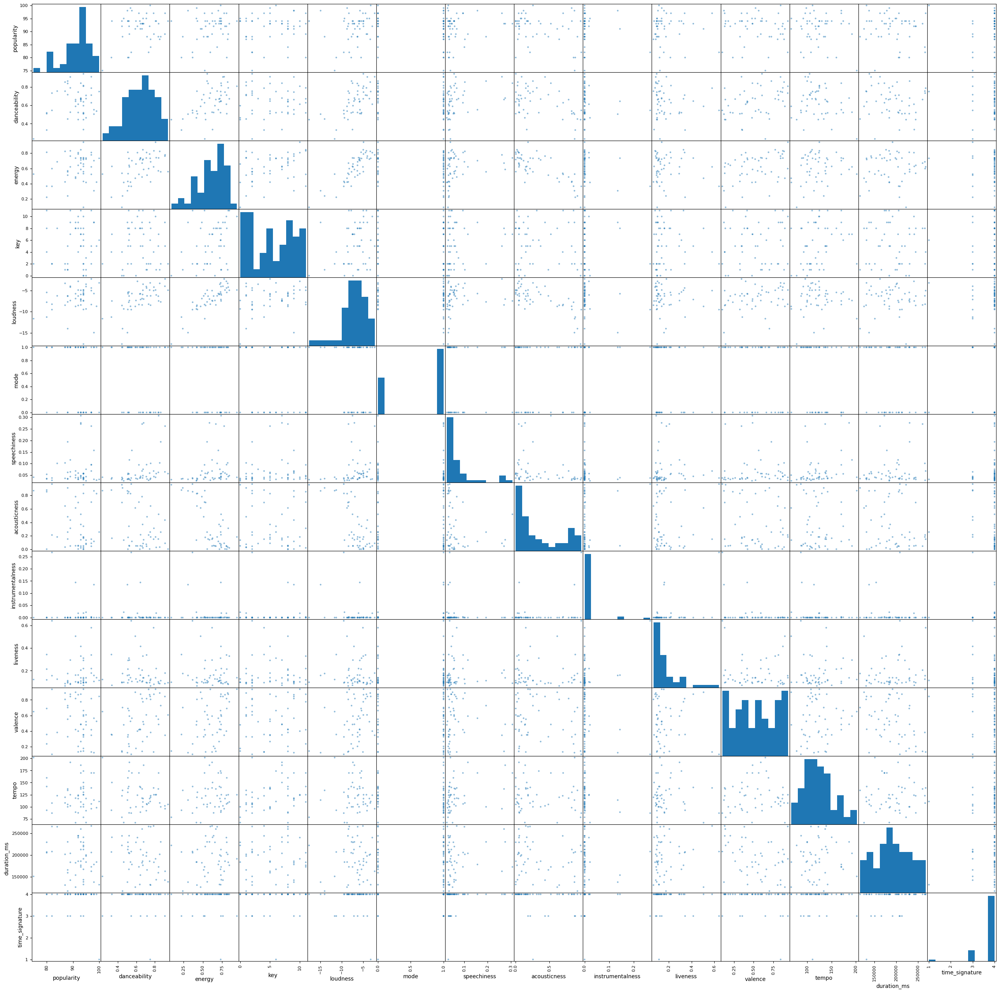

In [19]:
from pandas.plotting import scatter_matrix
scatter_matrix(top_50_global['song_data'], figsize=(32,32));

# **Example 2** - Some Favorites

In [20]:
try: some_favorites # Thomas Holtz's personal playlist
except NameError: some_favorites = None
if some_favorites is None:
    some_favorites = complete_generator("4VTmuzJb0KFDU2q53yFxHp") # https://open.spotify.com/playlist/4VTmuzJb0KFDU2q53yFxHp

In [21]:
some_favorites_desc_matches = description_matches(some_favorites)
description_match_print(some_favorites_desc_matches)

Popularity Matches
['min', '25%'] ['100 Years by Five For Fighting', '20K by Pegboard Nerds', 'Adventure Time by Rogue', 'Airbag by Radiohead', 'Andicuri by Joe Pisapia', 'Andrew Eldritch Is Moving Back to Leeds by The Mountain Goats', 'Ano Nagarus by Group Inerane', 'Another Day (Original Mix) by TVDS', 'Antihero by Noisestorm', 'Aphasia by Mr FijiWiji', 'Apollo - Electro Mix by Astronaut', 'Aura by Telepathics', 'BAD NEWS by Rituals of Mine', 'BADBOI by Pegboard Nerds', 'Be Still by Becca Stevens', "Believe (feat. Connor Zwetsch) by ['Trivecta', 'Connor Zwetsch']", 'Belle Isle - Without Overdubs, Self Portrait by Bob Dylan', 'Better With Time by Grabbitz', 'Bloom by Radiohead', "Boy and the Beast by ['Puppet', 'Pierce Fulton']", "Break Over You by ['Draper', 'Prides']", 'Bron-Yr-Aur - 1993 Remaster by Led Zeppelin', 'Build the Cities [Classical] by Karma Fields', 'Burn the Witch by Radiohead', "Busy Earnin' by Jungle", 'Captivating by Neilio', 'Careful by Guster', 'Casio by Jungle', 

In [22]:
pd.DataFrame([number_to_music_key(i) for i in some_favorites['song_data']['key']]).value_counts()

G        90
C        80
D        78
A        76
F        73
B        67
C#/D♭    64
E        50
A#/B♭    48
G#/A♭    46
F#/G♭    41
D#/E♭    15
Name: count, dtype: int64

In [23]:
some_favorites['song_data'][some_favorites['song_data']['key'] == 3]

,Song Name,Artist Name,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,...,liveness,valence,tempo,type,id,uri,track_href,analysis_url,duration_ms,time_signature
41,Bad Day,Daniel Powter,76,0.599,0.7850,3,-4.013,1,0.0309,0.4480,...,0.1510,0.520,140.046,audio_features,0mUyMawtxj1CJ76kn9gIZK,spotify:track:0mUyMawtxj1CJ76kn9gIZK,https://api.spotify.com/v1/tracks/0mUyMawtxj1C...,https://api.spotify.com/v1/audio-analysis/0mUy...,233640,4
51,Beautiful Dreamer,"[Stephen Foster, Thomas Hampson]",10,0.377,0.0696,3,-21.138,1,0.0524,0.9800,...,0.0933,0.339,77.339,audio_features,4N6hfXvM2VJ6lw7C7MVo23,spotify:track:4N6hfXvM2VJ6lw7C7MVo23,https://api.spotify.com/v1/tracks/4N6hfXvM2VJ6...,https://api.spotify.com/v1/audio-analysis/4N6h...,233573,4
91,Buona Sera - Remastered 2002,"[Louis Prima, Keely Smith, Sam Butera & The Wi...",52,0.544,0.4590,3,-8.069,1,0.0524,0.6890,...,0.0346,0.850,99.175,audio_features,7LYfx4uOewuMJnkAN4xHlj,spotify:track:7LYfx4uOewuMJnkAN4xHlj,https://api.spotify.com/v1/tracks/7LYfx4uOewuM...,https://api.spotify.com/v1/audio-analysis/7LYf...,180093,4
104,Catch You,Kill Paris,27,0.590,0.8290,3,-4.710,0,0.0716,0.0504,...,0.0233,0.402,109.898,audio_features,1y8QMxR3O00rnkN0FKeMtB,spotify:track:1y8QMxR3O00rnkN0FKeMtB,https://api.spotify.com/v1/tracks/1y8QMxR3O00r...,https://api.spotify.com/v1/audio-analysis/1y8Q...,214240,4
107,' Cello Song,Nick Drake,55,0.507,0.3900,3,-17.218,1,0.0326,0.6570,...,0.0613,0.520,118.805,audio_features,42yexCY4dCftowtAZXuAIj,spotify:track:42yexCY4dCftowtAZXuAIj,https://api.spotify.com/v1/tracks/42yexCY4dCft...,https://api.spotify.com/v1/audio-analysis/42ye...,284987,4
175,Eh Cumpari,Julius LaRosa,32,0.842,0.3110,3,-9.776,1,0.0689,0.8560,...,0.0719,0.780,132.114,audio_features,6ydDMTSuSv3wqRgzfam46S,spotify:track:6ydDMTSuSv3wqRgzfam46S,https://api.spotify.com/v1/tracks/6ydDMTSuSv3w...,https://api.spotify.com/v1/audio-analysis/6ydD...,148067,4
201,Firelight,Young the Giant,44,0.300,0.2840,3,-13.061,0,0.0307,0.9200,...,0.1000,0.173,188.203,audio_features,2bBQg0zLuhXcVvqSSriawP,spotify:track:2bBQg0zLuhXcVvqSSriawP,https://api.spotify.com/v1/tracks/2bBQg0zLuhXc...,https://api.spotify.com/v1/audio-analysis/2bBQ...,333987,4
307,Idioteque,Radiohead,0,0.615,0.9310,3,-7.800,1,0.2400,0.0352,...,0.0914,0.530,137.544,audio_features,7xqeIdLJSf3bgmZ7vUvHrE,spotify:track:7xqeIdLJSf3bgmZ7vUvHrE,https://api.spotify.com/v1/tracks/7xqeIdLJSf3b...,https://api.spotify.com/v1/audio-analysis/7xqe...,309093,3
324,Into the Limelight (feat. Danyka Nadeau),"[Trivecta, Danyka]",0,0.522,0.9310,3,-4.646,1,0.0616,0.0935,...,0.1030,0.457,127.928,audio_features,6VkVzHGvYvcKT6aiAE19ue,spotify:track:6VkVzHGvYvcKT6aiAE19ue,https://api.spotify.com/v1/tracks/6VkVzHGvYvcK...,https://api.spotify.com/v1/audio-analysis/6VkV...,270000,4
350,Kiss Me,Sixpence None The Richer,83,0.526,0.7490,3,-6.964,1,0.0283,0.0230,...,0.0692,0.421,99.982,audio_features,754kgU5rWscRTfvlsuEwFp,spotify:track:754kgU5rWscRTfvlsuEwFp,https://api.spotify.com/v1/tracks/754kgU5rWscR...,https://api.spotify.com/v1/audio-analysis/754k...,208680,4


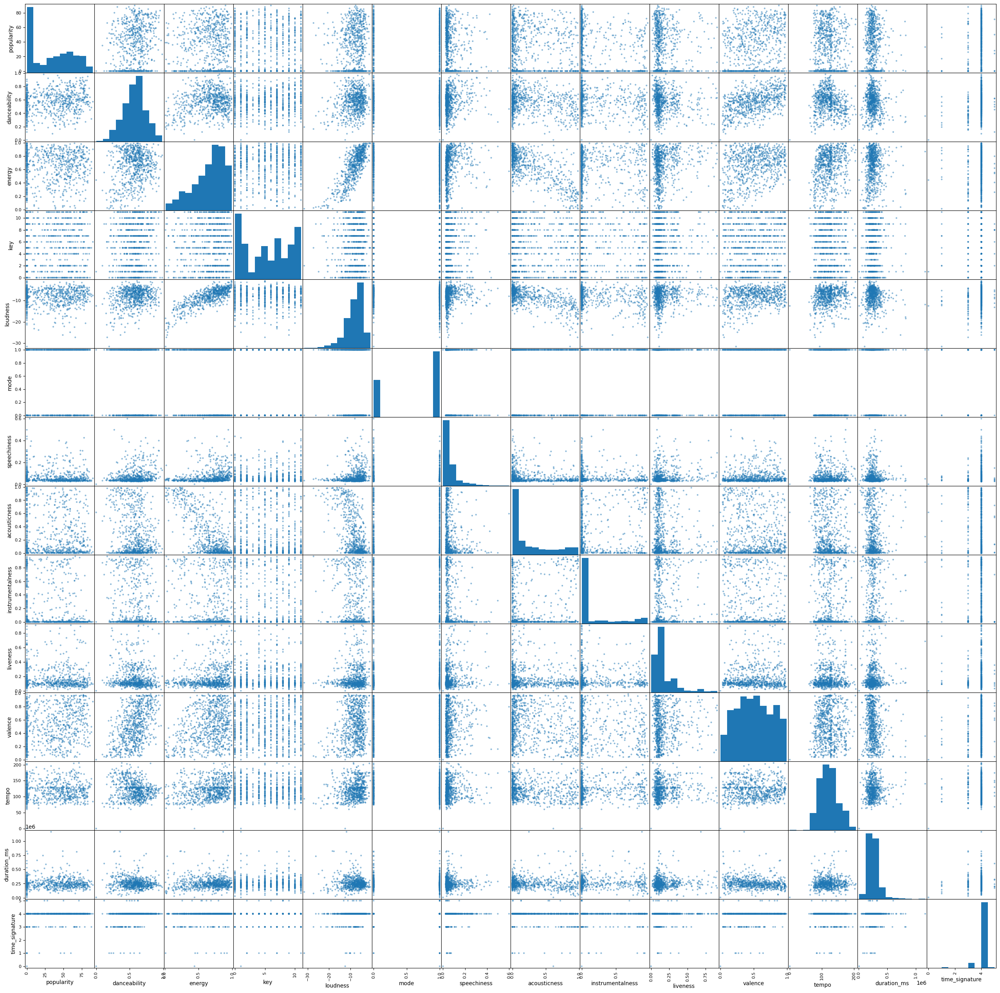

In [24]:
scatter_matrix(some_favorites['song_data'], figsize=(32,32));

In [25]:
some_favorites['song_data'][some_favorites['song_data']['time_signature'] == some_favorites['description'].loc['max', 'time_signature']]

,Song Name,Artist Name,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,...,liveness,valence,tempo,type,id,uri,track_href,analysis_url,duration_ms,time_signature
140,The Crunge - Remaster,Led Zeppelin,50,0.531,0.798,2,-8.514,1,0.1480,0.13200,...,0.3560,0.8520,112.609,audio_features,7IgBLFklu75pp8Y1vphChS,spotify:track:7IgBLFklu75pp8Y1vphChS,https://api.spotify.com/v1/tracks/7IgBLFklu75p...,https://api.spotify.com/v1/audio-analysis/7IgB...,197704,5
178,Eleven Four,The Dave Brubeck Quartet,24,0.497,0.406,8,-11.247,1,0.0371,0.72100,...,0.2330,0.8130,101.940,audio_features,7gWYNCMKCPr5ldxRPbEJbO,spotify:track:7gWYNCMKCPr5ldxRPbEJbO,https://api.spotify.com/v1/tracks/7gWYNCMKCPr5...,https://api.spotify.com/v1/audio-analysis/7gWY...,171933,5
471,Orbit (feat. Richard Caddock),"[WRLD, Richard Caddock]",0,0.571,0.620,6,-5.791,1,0.0267,0.00544,...,0.0923,0.6250,150.012,audio_features,3BkLpheTPPxLrAvi0dHId8,spotify:track:3BkLpheTPPxLrAvi0dHId8,https://api.spotify.com/v1/tracks/3BkLpheTPPxL...,https://api.spotify.com/v1/audio-analysis/3BkL...,240000,5
507,Queen Of Your Heart,"[Tut Tut Child, Augustus Ghost]",28,0.620,0.541,4,-7.285,1,0.0471,0.13100,...,0.2810,0.2730,144.949,audio_features,5C7hRt9JRBhFcYUzTq1LVR,spotify:track:5C7hRt9JRBhFcYUzTq1LVR,https://api.spotify.com/v1/tracks/5C7hRt9JRBhF...,https://api.spotify.com/v1/audio-analysis/5C7h...,316352,5
578,Someone Like You,Adrian Duffy & The Mayo Brothers,0,0.622,0.687,8,-5.140,1,0.0272,0.00998,...,0.0314,0.7330,129.996,audio_features,34VA1fE4h1z9RMKmHeUsUw,spotify:track:34VA1fE4h1z9RMKmHeUsUw,https://api.spotify.com/v1/tracks/34VA1fE4h1z9...,https://api.spotify.com/v1/audio-analysis/34VA...,198213,5
605,Svefn-g-englar,Sigur Rós,0,0.119,0.555,9,-9.081,1,0.0563,0.55700,...,0.1110,0.0452,68.055,audio_features,2fkPXXnPh0jhtwcTxLobqd,spotify:track:2fkPXXnPh0jhtwcTxLobqd,https://api.spotify.com/v1/tracks/2fkPXXnPh0jh...,https://api.spotify.com/v1/audio-analysis/2fkP...,604267,5
613,Take Five,The Dave Brubeck Quartet,71,0.454,0.260,8,-13.193,0,0.0401,0.53900,...,0.0675,0.5980,174.322,audio_features,1YQWosTIljIvxAgHWTp7KP,spotify:track:1YQWosTIljIvxAgHWTp7KP,https://api.spotify.com/v1/tracks/1YQWosTIljIv...,https://api.spotify.com/v1/audio-analysis/1YQW...,324133,5


# **Example 3** - 10000 songs

In [26]:
try: ten_thousand_songs # A playlist with ten thousand songs
except NameError: ten_thousand_songs = None
if ten_thousand_songs is None:
    ten_thousand_songs = complete_generator('32twOqGf8gIswTgzG3IKxP') #https://open.spotify.com/playlist/32twOqGf8gIswTgzG3IKxP

In [27]:
ten_thousand_songs['description'].style

,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature
mean,17.329394,51.6%,69.3%,5.289334001001502,-7.644,major,6.37%,20.7110%,10.035134%,20.66%,48.47%,124.207,04:07:568,3.92/4
std,23.477527,15.9%,23.9%,3.525194263933296,3.803,major,6.36%,28.3598%,23.441363%,18.21%,24.85%,29.158,01:21:800,0.33/4
min,0.000000,6.3%,0.0%,C,-34.486,minor,2.25%,0.0000%,0.000000%,1.36%,2.92%,45.212,00:35:587,0/4
25%,0.000000,40.8%,52.7%,D,-9.638,minor,3.27%,0.2830%,0.000157%,9.62%,28.50%,101.936,03:21:787,4/4
50%,0.000000,51.9%,74.6%,F,-6.770,major,4.21%,5.2600%,0.024800%,13.30%,47.20%,122.531,03:56:133,4/4
75%,38.000000,62.6%,89.9%,G#/A♭,-4.848,major,6.82%,32.7000%,2.480000%,26.90%,68.20%,143.012,04:36:827,4/4
max,91.000000,97.8%,99.9%,B,1.275,major,95.40%,99.6000%,98.700000%,99.80%,98.50%,219.993,28:14:907,5/4


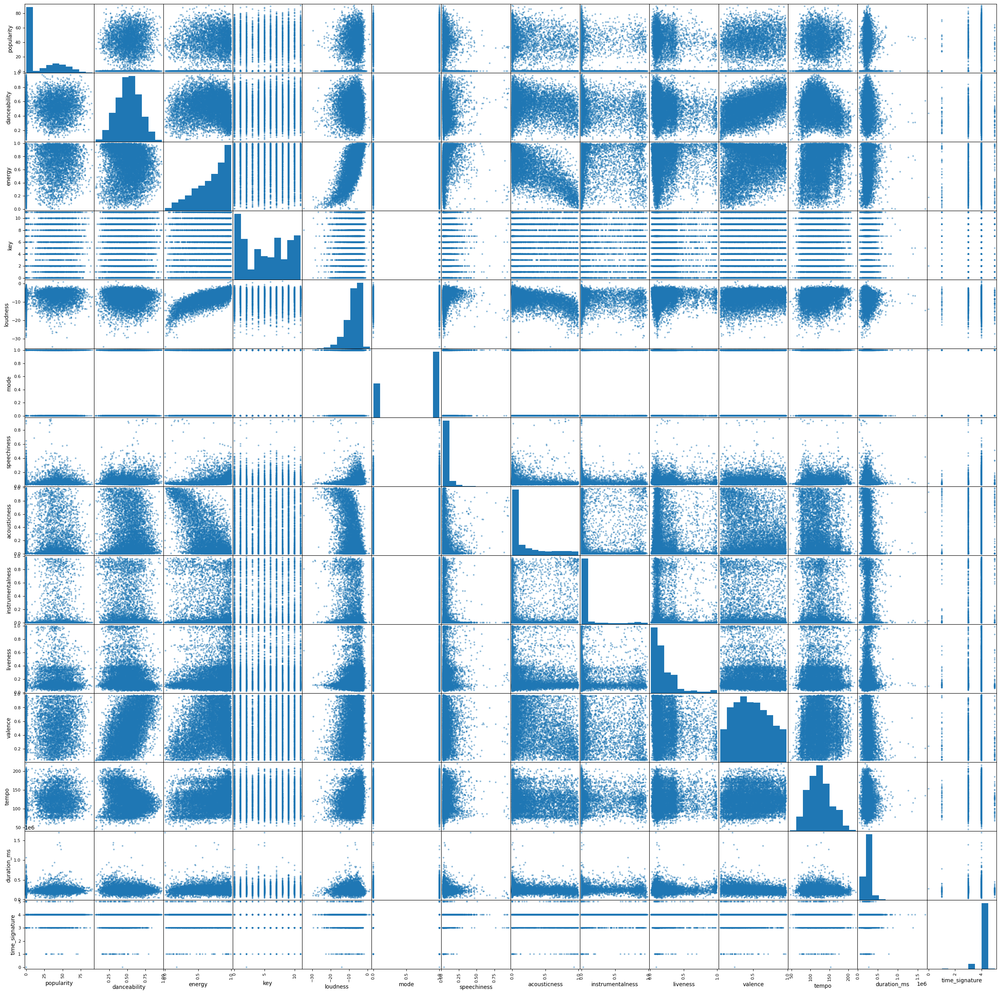

In [28]:
scatter_matrix(ten_thousand_songs['song_data'], figsize=(32,32));

# **Example 4** - boom, boom, boom, boom!!!

In [29]:
try: boom_boom_boom_boom # Playlist with 10951 instances of "Boom, Boom, Boom, Boom!!" by Vengaboys
except NameError: boom_boom_boom_boom = None
if boom_boom_boom_boom is None:
    boom_boom_boom_boom = complete_generator('5SwCIuMKEF1lzt1mBUXS0K') # https://open.spotify.com/playlist/5SwCIuMKEF1lzt1mBUXS0K

In [30]:
print(len(boom_boom_boom_boom['song_data']))
boom_boom_boom_boom['description'].style

10951


,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature
mean,0.000000,80.1%,94.7%,B,-4.624,minor,3.87%,1.1800%,42.700000%,2.48%,96.80%,138.489,03:22:583,4/4
std,0.000000,0.0%,0.0%,C,0.000,minor,0.00%,0.0000%,0.000000%,0.00%,0.00%,0.000,00:00:000,0/4
min,0.000000,80.1%,94.7%,B,-4.624,minor,3.87%,1.1800%,42.700000%,2.48%,96.80%,138.489,03:22:583,4/4
25%,0.000000,80.1%,94.7%,B,-4.624,minor,3.87%,1.1800%,42.700000%,2.48%,96.80%,138.489,03:22:583,4/4
50%,0.000000,80.1%,94.7%,B,-4.624,minor,3.87%,1.1800%,42.700000%,2.48%,96.80%,138.489,03:22:583,4/4
75%,0.000000,80.1%,94.7%,B,-4.624,minor,3.87%,1.1800%,42.700000%,2.48%,96.80%,138.489,03:22:583,4/4
max,0.000000,80.1%,94.7%,B,-4.624,minor,3.87%,1.1800%,42.700000%,2.48%,96.80%,138.489,03:22:583,4/4


# **Appendix**

This was scrapped, but it allows a pre-named data dictionary variable to be generated automatically.

In [ ]:
## cf. https://stackoverflow.com/a/1546245, https://stackoverflow.com/a/3939381
# id = str(input("Enter playlist ID: "))
# name = __import__('re').sub("\s\s+" , " ", sp.playlist(id)['name'].translate(dict.fromkeys(map(ord, __import__('string').punctuation), None))).replace(' ', '_').lower()
# print(f"Your playlist data set will be called '{name}'.")
# exec(name + " = complete_generator(id)")

This is a template for filtering song data by an artist.

In [ ]:
# top_50_global['song_data'].explode('Artist Name')[top_50_global['song_data'].explode('Artist Name')['Artist Name'] == 'Jung Kook']

In [ ]:
# Spotipy's audio_features() function does not work on this playlist, probably because it has no name.
# cf. https://community.spotify.com/t5/Your-Library/Unnamed-No-Title-Playlists-not-showing-up-in-Library/m-p/5448832/highlight/true#M25422
try: willis_orr_record
except NameError: willis_orr_record = None
if willis_orr_record is None:
    willis_orr_record = complete_generator('5S8SJdl1BDc0ugpkEvFsIL') #https://open.spotify.com/playlist/5S8SJdl1BDc0ugpkEvFsIL

In [ ]:
def section_analysis(confident_data):
    pd.DataFrame.from_dict({n: i for n,i in enumerate(confident_data['sections'])}, orient='index').style.\
    format(lambda x: sec_to_full(x), subset=['duration'])

In [ ]:
confidences = [itemgetter('tempo_confidence', 'time_signature_confidence', 'key_confidence', 'mode_confidence')(i) for i in [analyses[n]['track'] for n in range(len(analyses))]]
tempo_confidence = [i[0] for n,i in enumerate(confidences)]
time_signature_confidence = [i[1] for n,i in enumerate(confidences)]
key_confidence = [i[2] for n,i in enumerate(confidences)]
mode_confidence = [i[3] for n,i in enumerate(confidences)]